## SF crime data analysis and modeling for Sichuan University Student

### In this notebook, I use Spark SQL for big data analysis on SF crime data. (https://data.sfgov.org/Public-Safety/Police-Department-Incident-Reports-Historical-2003/tmnf-yvry). 

In [0]:
from csv import reader
from pyspark.sql import Row 
from pyspark.sql import SparkSession
from pyspark.sql.types import *
import pandas as pd
import numpy as np
import seaborn as sb
import matplotlib.pyplot as plt
import warnings

import os
os.environ["PYSPARK_PYTHON"] = "python3"

In [0]:
data_path = "dbfs:/laioffer/spark_hw1/data/sf_03_18.csv"

## data processing

In [0]:
# read data from the data storage
# please upload your data into databricks community at first. 
crime_data_lines = sc.textFile(data_path)
#prepare data 
print(crime_data_lines.first())

PdId,IncidntNum,Incident Code,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,Address,X,Y,location,SF Find Neighborhoods 2 2,Current Police Districts 2 2,Current Supervisor Districts 2 2,Analysis Neighborhoods 2 2,DELETE - Fire Prevention Districts 2 2,DELETE - Police Districts 2 2,DELETE - Supervisor Districts 2 2,DELETE - Zip Codes 2 2,DELETE - Neighborhoods 2 2,DELETE - 2017 Fix It Zones 2 2,Civic Center Harm Reduction Project Boundary 2 2,Fix It Zones as of 2017-11-06  2 2,DELETE - HSOC Zones 2 2,Fix It Zones as of 2018-02-07 2 2,"CBD, BID and GBD Boundaries as of 2017 2 2","Areas of Vulnerability, 2016 2 2",Central Market/Tenderloin Boundary 2 2,Central Market/Tenderloin Boundary Polygon - Updated 2 2,HSOC Zones as of 2018-06-05 2 2,OWED Public Spaces 2 2,Neighborhoods 2


## Get dataframe and sql

In [0]:
from pyspark.sql import SparkSession
spark = SparkSession \
    .builder \
    .appName("crime analysis") \
    .config("spark.some.config.option", "some-value") \
    .getOrCreate()

df_opt1 = spark.read.format("csv").option("header", "true").load(data_path)
display(df_opt1)
df_opt1.createOrReplaceTempView("sf_crime")

PdId,IncidntNum,Incident Code,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,Address,X,Y,location,SF Find Neighborhoods 2 2,Current Police Districts 2 2,Current Supervisor Districts 2 2,Analysis Neighborhoods 2 2,DELETE - Fire Prevention Districts 2 2,DELETE - Police Districts 2 2,DELETE - Supervisor Districts 2 2,DELETE - Zip Codes 2 2,DELETE - Neighborhoods 2 2,DELETE - 2017 Fix It Zones 2 2,Civic Center Harm Reduction Project Boundary 2 2,Fix It Zones as of 2017-11-06 2 2,DELETE - HSOC Zones 2 2,Fix It Zones as of 2018-02-07 2 2,"CBD, BID and GBD Boundaries as of 2017 2 2","Areas of Vulnerability, 2016 2 2",Central Market/Tenderloin Boundary 2 2,Central Market/Tenderloin Boundary Polygon - Updated 2 2,HSOC Zones as of 2018-06-05 2 2,OWED Public Spaces 2 2,Neighborhoods 2
4133422003074,041334220,03074,ROBBERY,"ROBBERY, BODILY FORCE",Monday,11/22/2004,17:50,INGLESIDE,NONE,GENEVA AV / SANTOS ST,-122.420084075249,37.7083109744362,POINT (-122.420084075249 37.7083109744362),null,null,9,null,null,null,8,309,null,null,null,null,null,null,null,null,null,null,null,null,null
5118535807021,051185358,07021,VEHICLE THEFT,STOLEN AUTOMOBILE,Tuesday,10/18/2005,20:00,PARK,NONE,TURK ST / STJOSEPHS AV,-120.5,90,POINT (-120.50000000000001 90),null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
4018830907021,040188309,07021,VEHICLE THEFT,STOLEN AUTOMOBILE,Sunday,02/15/2004,02:00,SOUTHERN,NONE,BRANNAN ST / 1ST ST,-120.5,90,POINT (-120.50000000000001 90),null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
11014543126030,110145431,26030,ARSON,ARSON,Friday,02/18/2011,05:27,INGLESIDE,NONE,0 Block of SANJUAN AV,-122.43622001281,37.7243766140428,POINT (-122.43622001281001 37.7243766140428),94,9,1,28,9,7,6,28861,25,null,null,null,null,null,null,1,null,null,null,null,94
10108108004134,101081080,04134,ASSAULT,BATTERY,Sunday,11/21/2010,17:00,SOUTHERN,NONE,400 Block of 10TH ST,-122.410541166987,37.7709130566165,POINT (-122.410541166987 37.7709130566165),32,1,10,34,8,2,9,28853,34,null,null,null,null,null,null,2,null,null,null,null,32
13027069804134,130270698,04134,ASSAULT,BATTERY,Tuesday,04/02/2013,15:50,TARAVAL,NONE,14TH AV / SANTIAGO ST,-122.470365997562,37.74515794927,POINT (-122.470365997562 37.74515794927),44,10,8,41,1,8,4,29491,40,null,null,null,null,null,null,1,null,null,null,null,44
17063991304134,170639913,04134,ASSAULT,BATTERY,Sunday,08/06/2017,18:15,SOUTHERN,NONE,800 Block of BRYANT ST,-122.40340479147905,37.775420706711,POINT (-122.40340479147905 37.775420706711),32,1,10,34,14,2,9,28853,34,null,null,null,null,null,null,2,null,null,null,null,32
16020415607020,160204156,07020,VEHICLE THEFT,STOLEN AND RECOVERED VEHICLE,Thursday,03/03/2016,19:30,TARAVAL,NONE,100 Block of BEPLER ST,-122.46354501681947,37.70796836450968,POINT (-122.46354501681947 37.70796836450968),null,null,null,null,null,null,null,28588,null,null,null,null,null,null,null,null,null,null,null,null,null
6068579904134,060685799,04134,ASSAULT,BATTERY,Saturday,06/17/2006,03:00,TARAVAL,NONE,3200 Block of SAN JOSE AV,-122.459172646607,37.7082001648459,POINT (-122.459172646607 37.7082001648459),null,null,null,null,null,null,null,28588,null,null,null,null,null,null,null,null,null,null,null,null,null
5134166327195,051341663,27195,TRESPASS,TRESPASSING,Monday,11/28/2005,16:04,TENDERLOIN,"ARREST, BOOKED",ELLIS ST / 5THSTNORTH ST,-120.5,90,POINT (-120.50000000000001 90),null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null


#### Q1 question (OLAP): 
##### Write a Spark program that counts the number of crimes for different category.

Below are some example codes to demonstrate the way to use Spark RDD, DF, and SQL to work with big data. You can follow this example to finish other questions. 

In [0]:
q1_result = spark.sql("""
                      SELECT category, COUNT(*)
                      AS Count 
                      FROM sf_crime
                      GROUP BY category
                      ORDER BY Count DESC
                      """)
q1_result.show()

+--------------------+------+
|            category| Count|
+--------------------+------+
|       LARCENY/THEFT|477975|
|      OTHER OFFENSES|301874|
|        NON-CRIMINAL|236928|
|             ASSAULT|167042|
|       VEHICLE THEFT|126228|
|       DRUG/NARCOTIC|117821|
|           VANDALISM|114718|
|            WARRANTS| 99821|
|            BURGLARY| 91067|
|      SUSPICIOUS OCC| 79087|
|             ROBBERY| 54467|
|      MISSING PERSON| 44268|
|               FRAUD| 41348|
|FORGERY/COUNTERFE...| 22995|
|     SECONDARY CODES| 22378|
|         WEAPON LAWS| 21004|
|            TRESPASS| 19194|
|        PROSTITUTION| 16501|
|     STOLEN PROPERTY| 11450|
|  DISORDERLY CONDUCT|  9932|
+--------------------+------+
only showing top 20 rows



In [0]:
crimeCategory = spark.sql("SELECT  category, COUNT(*) AS Count FROM sf_crime GROUP BY category ORDER BY Count DESC")
display(crimeCategory)

category,Count
LARCENY/THEFT,477975
OTHER OFFENSES,301874
NON-CRIMINAL,236928
ASSAULT,167042
VEHICLE THEFT,126228
DRUG/NARCOTIC,117821
VANDALISM,114718
WARRANTS,99821
BURGLARY,91067
SUSPICIOUS OCC,79087


Databricks visualization. Run in Databricks to view.

### Q1 RESULT: 
From the results, LARCENY/THEFT is the most common type of crime, and there is a significant difference in the number of different types of crimes. Therefore, further classification of these crimes can be considered.

In [0]:
crimes_pd_df = crimeCategory.toPandas()
display(crimes_pd_df)

category,Count
LARCENY/THEFT,477975
OTHER OFFENSES,301874
NON-CRIMINAL,236928
ASSAULT,167042
VEHICLE THEFT,126228
DRUG/NARCOTIC,117821
VANDALISM,114718
WARRANTS,99821
BURGLARY,91067
SUSPICIOUS OCC,79087


<Figure size 432x288 with 0 Axes>

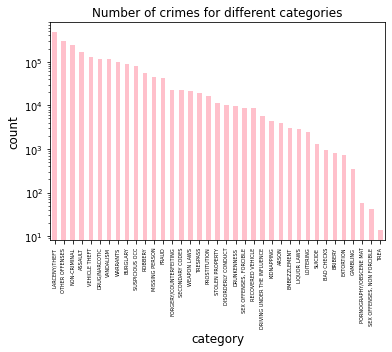

In [0]:
plt.figure()
ax = crimes_pd_df.plot(kind = 'bar',x = 'category',y = 'Count',logy= True,color = 'pink',legend = False, align = 'center')
ax.set_ylabel('count',fontsize = 12)
ax.set_xlabel('category',fontsize = 12)
plt.xticks(fontsize=5, rotation=90)
plt.title('Number of crimes for different categories')
display()

#### Q2 question (OLAP)
Counts the number of crimes for different district, and visualize your results

In [0]:
q2_result = spark.sql(
  "SELECT PdDistrict, COUNT(*) AS count FROM sf_crime GROUP BY 1 ORDER BY 2 DESC"
  )
num_crime = spark.sql("""
                      SELECT PdDistrict,
                      COUNT(*) AS count
                      FROM sf_crime
                      GROUP BY 1
                      ORDER BY 2 DESC
                      """)
display(q2_result)

PdDistrict,count
SOUTHERN,390692
MISSION,288985
NORTHERN,266435
CENTRAL,221923
BAYVIEW,205480
TENDERLOIN,186954
INGLESIDE,181092
TARAVAL,155461
PARK,119698
RICHMOND,112804


<Figure size 432x288 with 0 Axes>

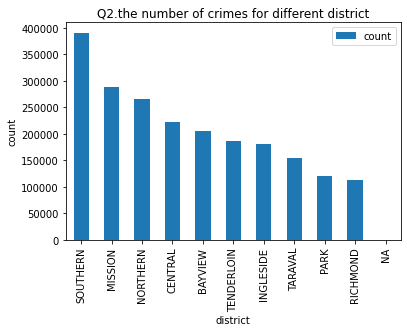

In [0]:
q2_crime = q2_result.toPandas()
plt.figure()
ax = q2_crime.plot(kind = 'bar',
                   x = 'PdDistrict',
                   y = 'count',
                   legend = 'False',
                   align = 'center')
ax.set_ylabel('count')
ax.set_xlabel('district')
plt.title('Q2.the number of crimes for different district')
display()

<Figure size 432x288 with 0 Axes>

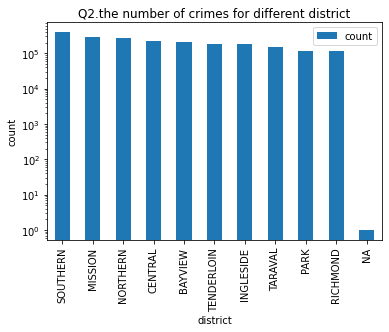

In [0]:
q2_crime = q2_result.toPandas()
plt.figure()
ax = q2_crime.plot(kind = 'bar',
                   x = 'PdDistrict',
                   y = 'count',
                   logy = True,
                   legend = 'False',
                   align = 'center')
ax.set_ylabel('count')
ax.set_xlabel('district')
plt.title('Q2.the number of crimes for different district')
display()

##### Q2 RESULT
After the analysis, it was found that the highest number of crimes occurred in the SOUTHERN, MISSION, and NORTHERN districts. During visualization, a logarithmic transformation was applied to the data to make the results more interpretable.

#### Q3
Count the number of crimes each "Sunday" at "SF downtown".

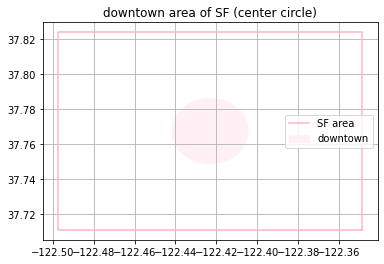

In [0]:
x = -122.42300858032046
y = 37.76739009566873
sizex = -0.14889135989699298
sizey = 0.1127418156566975

rectx = [x - sizex/2, x + sizex/2, x + sizex/2, x - sizex/2, x - sizex/2]
recty = [y - sizey/2, y - sizey/2, y + sizey/2, y + sizey/2, y - sizey/2]

plt.plot(rectx, recty, color='lightpink')

plt.rcParams['xtick.bottom'] = plt.rcParams['xtick.labelbottom'] = True
plt.rcParams['xtick.top'] = plt.rcParams['xtick.labeltop'] = False

dtsize = sizex / 8
dtrectx = list(np.linspace(x - dtsize, x + dtsize, 120))
dtrecty = [((dtsize)**2 - (_ - x)**2)**0.5 + y for _ in dtrectx] + [-((dtsize)**2 - (_ - x)**2)**0.5 + y for _ in dtrectx]

plt.fill(dtrectx + dtrectx, dtrecty, color='lavenderblush')
plt.legend(('SF area', 'downtown'))
plt.title('sundowntown area of SF (center circle)')
plt.grid(True)
plt.show()



In [0]:
q3_result = spark.sql(
  """
  with SUN_DT_CRIME as(
    SELECT substring(Date,1,5) as Date,
           substring(Date,7) as Year
    from sf_crime
    where (DayOfWeek = 'Sunday'
           and POWER(X + 122.431297, 2) + POWER(Y - 37.773972, 2) <= POWER(0.0186, 2))
    )
  SELECT Year,Date,Count(*) as Count
  FROM SUN_DT_CRIME
  GROUP BY Year,Date
  ORDER BY Year,Date
  """
)
displayHTML("<h2>Sunday Crime of SF</h2>")
display(q3_result)

Sunday Crime of SF

Year,Date,Count
2003,01/05,96
2003,01/12,79
2003,01/19,66
2003,01/26,78
2003,02/02,85
2003,02/09,100
2003,02/16,89
2003,02/23,90
2003,03/02,93
2003,03/09,73


In [0]:
q3_total_result = spark.sql(
"""
with SUN_DT_CRIME as (
    SELECT substring(Date,1,5) as Date,
           substring(Date,7) as Year
    from sf_crime
    where (DayOfWeek = 'Sunday')
      and POWER(X + 122.431297, 2) + POWER(Y - 37.773972, 2) <= POWER(0.0186, 2)
)

SELECT SUM(Count) as Total_Sunday_Crimes
FROM (
    SELECT Year, Date, COUNT(*) as Count
    FROM SUN_DT_CRIME
    GROUP BY Year, Date
) as crime_data
"""
)
q3_total_result.show()


+-------------------+
|Total_Sunday_Crimes|
+-------------------+
|              69710|
+-------------------+



##### According to the result, the total Sunday crimes of SF is 69710.

#### Q4 question (OLAP)
Analysis the number of crime in each month of 2015, 2016, 2017, 2018. Then, give your insights for the output results. What is the business impact for your result?  

In [0]:
df_opt2 = df_opt1[['IncidntNum', 'Category', 'Descript', 'DayOfWeek', 'Date', 'Time', 'PdDistrict', 'Resolution', 'Address', 'X', 'Y', 'Location']]
display(df_opt2)
df_opt2.createOrReplaceTempView("sf_crime")

IncidntNum,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,Address,X,Y,Location
041334220,ROBBERY,"ROBBERY, BODILY FORCE",Monday,11/22/2004,17:50,INGLESIDE,NONE,GENEVA AV / SANTOS ST,-122.420084075249,37.7083109744362,POINT (-122.420084075249 37.7083109744362)
051185358,VEHICLE THEFT,STOLEN AUTOMOBILE,Tuesday,10/18/2005,20:00,PARK,NONE,TURK ST / STJOSEPHS AV,-120.5,90,POINT (-120.50000000000001 90)
040188309,VEHICLE THEFT,STOLEN AUTOMOBILE,Sunday,02/15/2004,02:00,SOUTHERN,NONE,BRANNAN ST / 1ST ST,-120.5,90,POINT (-120.50000000000001 90)
110145431,ARSON,ARSON,Friday,02/18/2011,05:27,INGLESIDE,NONE,0 Block of SANJUAN AV,-122.43622001281,37.7243766140428,POINT (-122.43622001281001 37.7243766140428)
101081080,ASSAULT,BATTERY,Sunday,11/21/2010,17:00,SOUTHERN,NONE,400 Block of 10TH ST,-122.410541166987,37.7709130566165,POINT (-122.410541166987 37.7709130566165)
130270698,ASSAULT,BATTERY,Tuesday,04/02/2013,15:50,TARAVAL,NONE,14TH AV / SANTIAGO ST,-122.470365997562,37.74515794927,POINT (-122.470365997562 37.74515794927)
170639913,ASSAULT,BATTERY,Sunday,08/06/2017,18:15,SOUTHERN,NONE,800 Block of BRYANT ST,-122.40340479147905,37.775420706711,POINT (-122.40340479147905 37.775420706711)
160204156,VEHICLE THEFT,STOLEN AND RECOVERED VEHICLE,Thursday,03/03/2016,19:30,TARAVAL,NONE,100 Block of BEPLER ST,-122.46354501681947,37.70796836450968,POINT (-122.46354501681947 37.70796836450968)
060685799,ASSAULT,BATTERY,Saturday,06/17/2006,03:00,TARAVAL,NONE,3200 Block of SAN JOSE AV,-122.459172646607,37.7082001648459,POINT (-122.459172646607 37.7082001648459)
051341663,TRESPASS,TRESPASSING,Monday,11/28/2005,16:04,TENDERLOIN,"ARREST, BOOKED",ELLIS ST / 5THSTNORTH ST,-120.5,90,POINT (-120.50000000000001 90)


In [0]:
df_opt2.createOrReplaceTempView('sf_crime')

In [0]:
q4_result = spark.sql("""
                      SELECT SUBSTRING(Date,1,2) AS MONTH, SUBSTRING(DATE,7,4) AS YEAR, COUNT(*) AS Count
                      From sf_crime
                      GROUP BY Year, Month
                      HAVING Year in (2015,2016,2017,2018)
                      ORDER BY Year, Month 
                      """)
display(q4_result)

MONTH,YEAR,Count
01,2015,13181
02,2015,11882
03,2015,13463
04,2015,12526
05,2015,13318
06,2015,12853
07,2015,12949
08,2015,13317
09,2015,12476
10,2015,12697


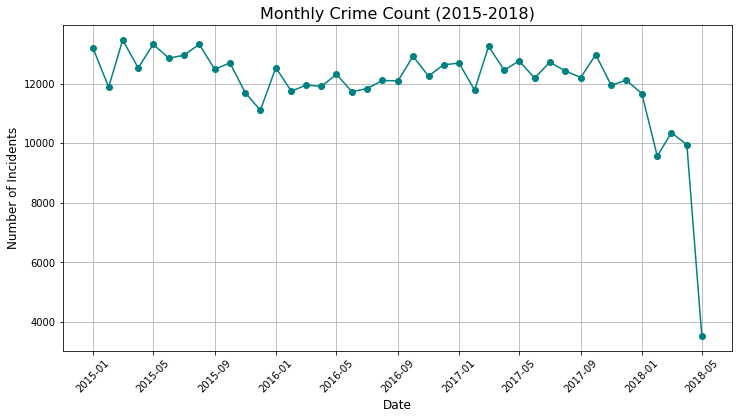

In [0]:
q4_df = q4_result.toPandas()
q4_df['Date'] = pd.to_datetime(q4_df['YEAR'] + '-' + q4_df['MONTH'] + '-01')
q4_df = q4_df.sort_values(by='Date')

plt.figure(figsize=(12, 6))
plt.plot(q4_df['Date'], q4_df['Count'], marker='o', color='teal')
plt.title('Monthly Crime Count (2015-2018)', fontsize=16)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Number of Incidents', fontsize=12)
plt.xticks(rotation=45)
plt.grid(True)

plt.show()

In [0]:
LT_result = spark.sql("""
                      SELECT SUBSTRING(Date, 7, 4) AS Year,
                             SUBSTRING(Date, 1, 2) AS Month,
                             COUNT(*) AS Theft_Count
                      FROM sf_crime
                      WHERE Category = 'LARCENY/THEFT' 
                            AND SUBSTRING(Date, 7, 4) IN ('2015', '2016', '2017', '2018')
                      GROUP BY Year, Month
                      ORDER BY Year, Month
                      """)

display(LT_result)

Year,Month,Theft_Count
2015,01,3705
2015,02,3276
2015,03,3811
2015,04,3478
2015,05,3837
2015,06,3749
2015,07,3873
2015,08,3694
2015,09,3422
2015,10,3264


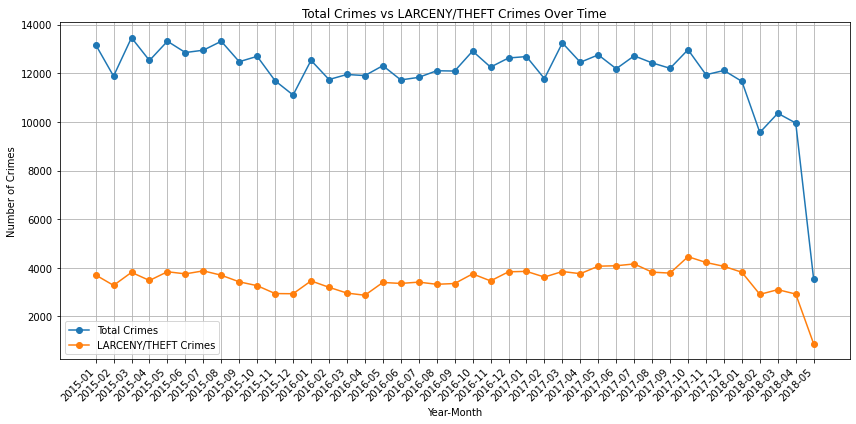

In [0]:
df_total = q4_result.toPandas()
df_theft = LT_result.toPandas()

df_total['YearMonth'] = df_total['YEAR'] + '-' + df_total['MONTH']
df_theft['YearMonth'] = df_theft['Year'] + '-' + df_theft['Month']

df_total = df_total.sort_values('YearMonth')
df_theft = df_theft.sort_values('YearMonth')

plt.figure(figsize=(12, 6))

plt.plot(df_total['YearMonth'], df_total['Count'], label='Total Crimes', marker='o')

plt.plot(df_theft['YearMonth'], df_theft['Theft_Count'], label='LARCENY/THEFT Crimes', marker='o')

plt.legend()
plt.title('Total Crimes vs LARCENY/THEFT Crimes Over Time')
plt.xlabel('Year-Month')
plt.ylabel('Number of Crimes')

plt.xticks(rotation=45, ha='right')
plt.grid(True)
plt.tight_layout() 
plt.show()

By examining the results, it can be observed that LARCENY/THEFT has consistently been the most common type of crime over these years, while crimes such as ASSAULT also had relatively high frequencies. From 2015 to early 2018, the overall number of crimes increased, with a notable decrease in May 2018.

Reason why the crime data added since 2015:

San Francisco's population have been growing during this period, leading to an increase in crime incidents simply due to a larger number of people. Economic conditions, such as unemployment or economic disparities, might have influenced crime rates.

Reasons why the crime data decreased since 2018.05:

New policing strategies, community outreach programs, or crime prevention initiatives implemented before or around May 2018 have started to show positive effects.

#### Q5 question (OLAP)
Analysis the number of crime with respsect to the hour in certian day like 2015/12/15, 2016/12/15, 2017/12/15. Then, give your travel suggestion to visit SF. 

In [0]:
q5_2015_result = spark.sql("""
    SELECT 
        hour(Time) AS Hour, 
        COUNT(*) AS Crime_Count
    FROM sf_crime
    WHERE (Date IN ('12/15/2015'))
    GROUP BY Hour
    ORDER BY Crime_Count DESC
""")

display(q5_2015_result)

Hour,Crime_Count
12,35
16,30
14,27
19,26
10,25
17,18
18,17
11,15
0,15
15,14


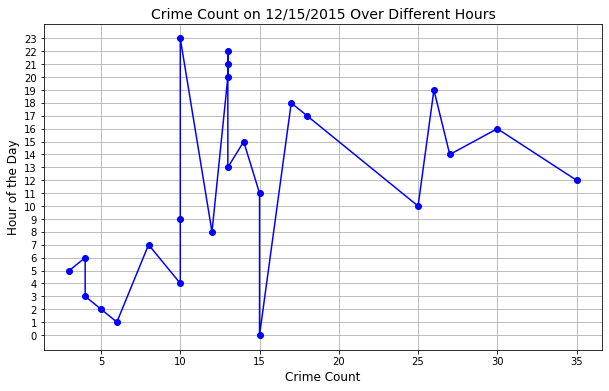

In [0]:
df = q5_2015_result.toPandas()

plt.figure(figsize=(10, 6))
plt.plot(df['Crime_Count'], df['Hour'], marker='o', linestyle='-', color='b')
plt.title('Crime Count on 12/15/2015 Over Different Hours', fontsize=14)
plt.ylabel('Hour of the Day', fontsize=12)
plt.xlabel('Crime Count', fontsize=12)
plt.grid(True)
plt.yticks(df['Hour'])
plt.show()

In [0]:
q5_2016_result = spark.sql("""
    SELECT 
        hour(Time) AS Hour, 
        COUNT(*) AS Crime_Count
    FROM sf_crime
    WHERE (Date IN ('12/15/2016'))
    GROUP BY Hour
    ORDER BY Crime_Count DESC
""")

display(q5_2016_result)

Hour,Crime_Count
18,38
19,30
12,29
20,25
9,23
22,22
8,21
0,21
17,19
14,19


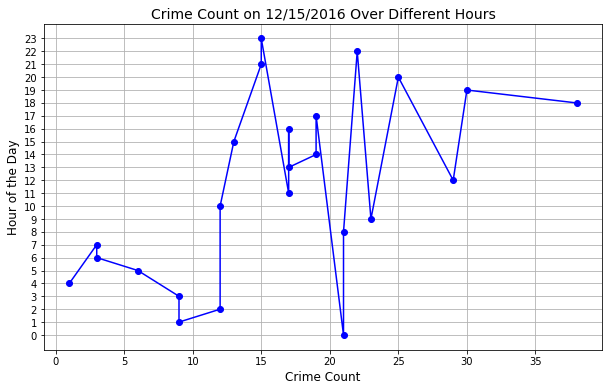

In [0]:
df = q5_2016_result.toPandas()

plt.figure(figsize=(10, 6))
plt.plot(df['Crime_Count'], df['Hour'], marker='o', linestyle='-', color='b')
plt.title('Crime Count on 12/15/2016 Over Different Hours', fontsize=14)
plt.ylabel('Hour of the Day', fontsize=12)
plt.xlabel('Crime Count', fontsize=12)
plt.grid(True)
plt.yticks(df['Hour'])
plt.show()

In [0]:
q5_2017_result = spark.sql("""
    SELECT 
        hour(Time) AS Hour, 
        COUNT(*) AS Crime_Count
    FROM sf_crime
    WHERE (Date IN ('12/15/2017'))
    GROUP BY Hour
    ORDER BY Crime_Count DESC
""")

display(q5_2017_result)

Hour,Crime_Count
22,36
16,30
0,30
19,29
23,28
18,28
17,27
10,27
15,26
8,26


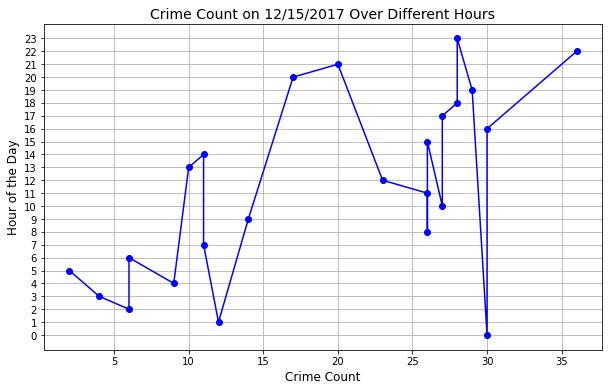

In [0]:
df = q5_2017_result.toPandas()

plt.figure(figsize=(10, 6))
plt.plot(df['Crime_Count'], df['Hour'], marker='o', linestyle='-', color='b')
plt.title('Crime Count on 12/15/2017 Over Different Hours', fontsize=14)
plt.ylabel('Hour of the Day', fontsize=12)
plt.xlabel('Crime Count', fontsize=12)
plt.grid(True)
plt.yticks(df['Hour'])
plt.show()

From the results, it can be observed that crime rates are relatively low only during a few time periods, such as the early morning hours. The highest crime rates occur around midnight and just before and after 7 PM. These times generally correspond to meal times, when people might be more relaxed and less vigilant in crowded environments. To avoid losing personal belongings, it is advisable for visitors to remain cautious and keep an eye on their possessions during dining and entertainment activities.

#### Q6 question (OLAP)
(1) Step1: Find out the top-3 danger disrict  
(2) Step2: find out the crime event w.r.t category and time (hour) from the result of step 1  
(3) give your advice to distribute the police based on your analysis results. 

In [0]:
q6_step1_result = spark.sql("""
                            SELECT PdDistrict, COUNT(*) AS Count
                            FROM sf_crime
                            GROUP BY 1
                            ORDER BY 2 DESC
                            LIMIT 3
                            """)
display(q6_step1_result)

PdDistrict,Count
SOUTHERN,390692
MISSION,288985
NORTHERN,266435


In [0]:
SOUTHERN_result = spark.sql("""
    SELECT PdDistrict, Category, hour(Time) AS Hour, COUNT(*) AS Crime_Count
    FROM sf_crime
    WHERE PdDistrict IN ('SOUTHERN')
    GROUP BY PdDistrict, Category, Hour
    ORDER BY PdDistrict, Crime_Count DESC
""")

display(SOUTHERN_result)

PdDistrict,Category,Hour,Crime_Count
SOUTHERN,LARCENY/THEFT,18,9580
SOUTHERN,LARCENY/THEFT,19,9161
SOUTHERN,LARCENY/THEFT,17,7842
SOUTHERN,LARCENY/THEFT,20,7378
SOUTHERN,LARCENY/THEFT,16,6670
SOUTHERN,LARCENY/THEFT,12,6406
SOUTHERN,LARCENY/THEFT,15,6308
SOUTHERN,LARCENY/THEFT,14,6178
SOUTHERN,LARCENY/THEFT,13,6111
SOUTHERN,LARCENY/THEFT,22,5952


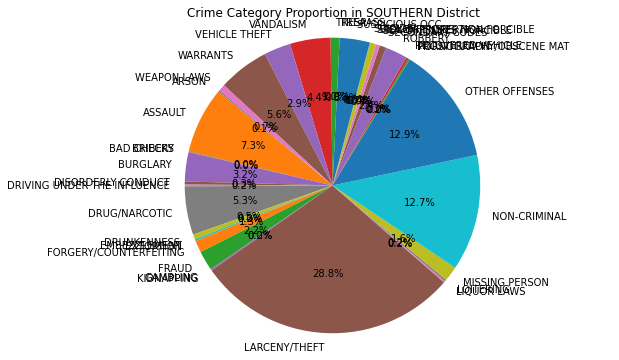

In [0]:
southern_df = SOUTHERN_result.toPandas()
crime_category_counts = southern_df.groupby('Category')['Crime_Count'].sum().reset_index()

plt.figure(figsize=(10, 6))
plt.pie(crime_category_counts['Crime_Count'], labels=crime_category_counts['Category'], autopct='%1.1f%%', startangle=140)
plt.title('Crime Category Proportion in SOUTHERN District')
plt.axis('equal')
plt.show()

In [0]:
MISSION_result = spark.sql("""
    SELECT PdDistrict, Category, hour(Time) AS Hour, COUNT(*) AS Crime_Count
    FROM sf_crime
    WHERE PdDistrict IN ('MISSION')
    GROUP BY PdDistrict, Category, Hour
    ORDER BY PdDistrict, Crime_Count DESC
""")

display(MISSION_result)

PdDistrict,Category,Hour,Crime_Count
MISSION,LARCENY/THEFT,18,3617
MISSION,LARCENY/THEFT,19,3467
MISSION,LARCENY/THEFT,20,3333
MISSION,LARCENY/THEFT,23,3176
MISSION,LARCENY/THEFT,22,3121
MISSION,OTHER OFFENSES,12,3028
MISSION,LARCENY/THEFT,21,3003
MISSION,OTHER OFFENSES,17,2873
MISSION,LARCENY/THEFT,17,2870
MISSION,OTHER OFFENSES,16,2801


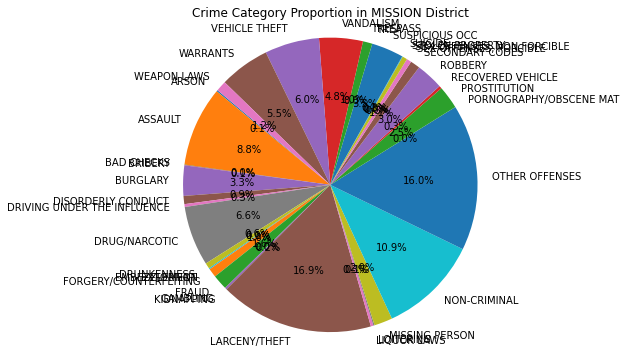

In [0]:
mission_df = MISSION_result.toPandas()
crime_category_counts = mission_df.groupby('Category')['Crime_Count'].sum().reset_index()

plt.figure(figsize=(10, 6))
plt.pie(crime_category_counts['Crime_Count'], labels=crime_category_counts['Category'], autopct='%1.1f%%', startangle=140)
plt.title('Crime Category Proportion in MISSION District')
plt.axis('equal')
plt.show()

In [0]:
NORTHERN_result = spark.sql("""
    SELECT PdDistrict, Category, hour(Time) AS Hour, COUNT(*) AS Crime_Count
    FROM sf_crime
    WHERE PdDistrict IN ('NORTHERN')
    GROUP BY PdDistrict, Category, Hour
    ORDER BY Crime_Count DESC
""")

display(NORTHERN_result)

PdDistrict,Category,Hour,Crime_Count
NORTHERN,LARCENY/THEFT,19,6816
NORTHERN,LARCENY/THEFT,18,6714
NORTHERN,LARCENY/THEFT,20,5893
NORTHERN,LARCENY/THEFT,17,5191
NORTHERN,LARCENY/THEFT,21,4946
NORTHERN,LARCENY/THEFT,22,4724
NORTHERN,LARCENY/THEFT,16,4392
NORTHERN,LARCENY/THEFT,23,4309
NORTHERN,LARCENY/THEFT,12,4200
NORTHERN,LARCENY/THEFT,15,4097


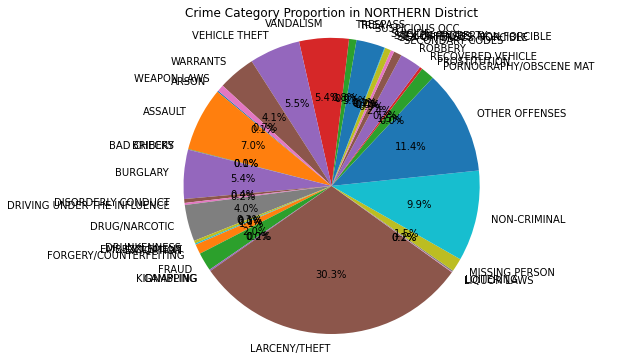

In [0]:
northern_df = NORTHERN_result.toPandas()
crime_category_counts = northern_df.groupby('Category')['Crime_Count'].sum().reset_index()

plt.figure(figsize=(10, 6))
plt.pie(crime_category_counts['Crime_Count'], labels=crime_category_counts['Category'], autopct='%1.1f%%', startangle=140)
plt.title('Crime Category Proportion in NORTHERN District')
plt.axis('equal')
plt.show()

After the analysis, it was found that the highest crime rates are in the SOUTHERN, MISSION, and NORTHERN districts. Additionally, the data shows that LARCENY/THEFT is the most frequent type of crime in these areas, with most crimes occurring around 6 PM.

#### Q7 question (OLAP)
For different category of crime, find the percentage of resolution. Based on the output, give your hints to adjust the policy.

In [0]:
res_num = spark.sql("""
                    SELECT category, resolution, COUNT(*) AS N_res 
                    FROM sf_crime 
                    GROUP BY category, resolution
                    """)
res_num.createOrReplaceTempView("res_num")

cate_num = spark.sql("""
                     SELECT category, COUNT(*) AS N_cate 
                     FROM sf_crime 
                     GROUP BY category
                     """)
cate_num.createOrReplaceTempView("cate_num")

q7_result = spark.sql("""
                      SELECT distinct sf_crime.category, sf_crime.resolution, N_res/N_cate AS Percentage
                      FROM (sf_crime 
                      LEFT JOIN res_num ON sf_crime.category = res_num.category AND sf_crime.resolution = res_num.resolution)
                      LEFT JOIN cate_num ON sf_crime.category = cate_num.category
                      ORDER BY category, resolution
                      """)
q7_result.createOrReplaceTempView("q7_result")
display(q7_result)

category,resolution,Percentage
ARSON,"ARREST, BOOKED",0.1625806451612903
ARSON,"ARREST, CITED",0.004387096774193549
ARSON,COMPLAINANT REFUSES TO PROSECUTE,7.741935483870968E-4
ARSON,EXCEPTIONAL CLEARANCE,5.161290322580645E-4
ARSON,NONE,0.8190967741935484
ARSON,NOT PROSECUTED,7.741935483870968E-4
ARSON,PROSECUTED BY OUTSIDE AGENCY,7.741935483870968E-4
ARSON,PROSECUTED FOR LESSER OFFENSE,2.5806451612903227E-4
ARSON,PSYCHOPATHIC CASE,0.004387096774193549
ARSON,UNFOUNDED,0.0064516129032258064


In [0]:
LT = spark.sql("""
               SELECT Resolution, Percentage
               FROM q7_result
               WHERE category = 'LARCENY/THEFT'
               ORDER BY Percentage DESC
               """)
display(LT)

Resolution,Percentage
NONE,0.9162131910664784
"ARREST, BOOKED",0.052588524504419684
"ARREST, CITED",0.021890266227313143
NOT PROSECUTED,0.0033474554108478475
UNFOUNDED,0.0025545269104032637
COMPLAINANT REFUSES TO PROSECUTE,9.854071865683352E-4
DISTRICT ATTORNEY REFUSES TO PROSECUTE,9.770385480412154E-4
EXCEPTIONAL CLEARANCE,9.247345572467179E-4
PROSECUTED BY OUTSIDE AGENCY,3.2637690255766513E-4
PSYCHOPATHIC CASE,9.833150269365553E-5


Databricks visualization. Run in Databricks to view.

In [0]:
ASSAULT = spark.sql("""
               SELECT Resolution, Percentage
               FROM q7_result
               WHERE category = 'ASSAULT'
               ORDER BY Percentage DESC
               """)
display(ASSAULT)

Resolution,Percentage
NONE,0.6258485889776224
"ARREST, BOOKED",0.29481208318865915
"ARREST, CITED",0.04206726452030028
DISTRICT ATTORNEY REFUSES TO PROSECUTE,0.012278349157696867
COMPLAINANT REFUSES TO PROSECUTE,0.010757773494091306
UNFOUNDED,0.005986518360651812
EXCEPTIONAL CLEARANCE,0.0037834796039319454
PSYCHOPATHIC CASE,0.0024125668993426803
NOT PROSECUTED,8.141664970486464E-4
PROSECUTED BY OUTSIDE AGENCY,6.106248727864848E-4


Databricks visualization. Run in Databricks to view.

In [0]:
V_T = spark.sql("""
               SELECT Resolution, Percentage
               FROM q7_result
               WHERE category = 'VEHICLE THEFT'
               ORDER BY Percentage DESC
               """)
display(V_T)

Resolution,Percentage
NONE,0.9188135754349273
"ARREST, BOOKED",0.04011788192793992
UNFOUNDED,0.03793928446937288
"ARREST, CITED",0.0014656019266723705
DISTRICT ATTORNEY REFUSES TO PROSECUTE,5.545520803625187E-4
COMPLAINANT REFUSES TO PROSECUTE,4.198751465601927E-4
EXCEPTIONAL CLEARANCE,2.772760401812593E-4
LOCATED,1.5844345153214818E-4
NOT PROSECUTED,1.5052127895554077E-4
PROSECUTED BY OUTSIDE AGENCY,8.71438983426815E-5


Databricks visualization. Run in Databricks to view.

#### CONCLUSION

Using Spark SQL, I extracted and analyzed critical data from vast datasets, applying various calculations and visualizations to present the results more intuitively. The analysis of crime data in San Francisco revealed a general increase in crime rates before 2018, with a noticeable decrease afterward. Additionally, the SOUTHERN, MISSION, and NORTHERN districts exhibited the highest crime rates, with LARCENY/THEFT being the most frequent type of crime, and most crimes remaining unresolved. These findings suggest potential factors such as policy changes, population growth, and individual behaviors, leading to the following recommendations: individuals should be particularly cautious with their belongings during meal and entertainment times, while law enforcement should explore more effective methods to reduce crime rates.